In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
import seaborn as sns
import plotly.express as px

In [2]:
med_df = pd.read_csv('Med_data_100k_sample.csv')

print(med_df.shape, 'Data read successfully')

(100000, 27) Data read successfully


In [3]:
med_df.head()

,Unnamed: 0,npi,nppes_provider_last_org_name,nppes_provider_first_name,nppes_provider_mi,nppes_credentials,nppes_provider_gender,nppes_entity_code,nppes_provider_street1,nppes_provider_street2,...,hcpcs_code,hcpcs_description,hcpcs_drug_indicator,line_srvc_cnt,bene_unique_cnt,bene_day_srvc_cnt,average_Medicare_allowed_amt,average_submitted_chrg_amt,average_Medicare_payment_amt,average_Medicare_standard_amt
0,5090423,1518038496,ZWIENER,JOHN,R,MD,M,I,1008 W PIERCE ST,SUITE 1A,...,88302,Pathology examination of tissue using a micros...,N,13.0,12.0,12.0,7.030000,7.030000,5.451538,5.921538
1,2087327,1205975224,DAVIS,COLE,NaN,M.D.,M,I,10901 E 48TH ST,NaN,...,87088,Bacterial urine culture,N,91.0,80.0,86.0,9.990000,25.000000,9.790000,9.790000
2,8848954,1881845543,RAMOS,GERALDO,A,MD,M,I,620 10TH STREET N.,NaN,...,99220,"Hospital observation care, typically 70 minutes",N,14.0,14.0,14.0,190.420000,424.714286,149.290000,148.740000
3,7935314,1790780021,YEH,GEORGE,L,MD,M,I,3414 OLANDWOOD CT,NaN,...,73130,"X-ray of hand, minimum of 3 views",N,43.0,30.0,42.0,36.101395,115.950000,26.387674,23.711163
4,748310,1073600938,VIRAMONTES,JOSE,NaN,M.D.,M,I,960 N 16TH ST,SUITE 108,...,36478,Laser destruction of incompetent vein of arm o...,N,12.0,12.0,12.0,263.392500,1002.333333,202.717500,217.568333


In [4]:
med_df.info(verbose=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Columns: 27 entries, Unnamed: 0 to average_Medicare_standard_amt
dtypes: float64(8), int64(2), object(17)
memory usage: 20.6+ MB


In [5]:
med_df.columns

Index(['Unnamed: 0', 'npi', 'nppes_provider_last_org_name',
       'nppes_provider_first_name', 'nppes_provider_mi', 'nppes_credentials',
       'nppes_provider_gender', 'nppes_entity_code', 'nppes_provider_street1',
       'nppes_provider_street2', 'nppes_provider_city', 'nppes_provider_zip',
       'nppes_provider_state', 'nppes_provider_country', 'provider_type',
       'medicare_participation_indicator', 'place_of_service', 'hcpcs_code',
       'hcpcs_description', 'hcpcs_drug_indicator', 'line_srvc_cnt',
       'bene_unique_cnt', 'bene_day_srvc_cnt', 'average_Medicare_allowed_amt',
       'average_submitted_chrg_amt', 'average_Medicare_payment_amt',
       'average_Medicare_standard_amt'],
      dtype='object')

In [6]:
drug_code_desc = med_df[['hcpcs_code', 'hcpcs_description']]
npi = med_df[['npi', 'nppes_provider_last_org_name',
              'nppes_provider_first_name','nppes_provider_gender', 'nppes_entity_code']]
provider_location = med_df[['nppes_provider_city', 'nppes_provider_zip', 'nppes_provider_state', 'nppes_provider_country']]

In [7]:
# Will drop all non-US rows then drop the country column since we know they are all US
med_df['nppes_provider_country'].value_counts()

US    99982
XX       14
GR        1
KR        1
DE        1
JP        1
Name: nppes_provider_country, dtype: int64

<h2>Feature Selection</h2><br>
<details>
    <summary><b>Click here to see steps taken</b></summary> 
 <lo>
    <li>Check for total missing values in each column</li>
    <li>Get the indexes for the rows to be dropped</li>
    <li>Drop the rows with unwanted coutries then drop the country column</li>
    </lo>
</details>  

In [8]:
med_df.isna().sum()

Unnamed: 0                              0
npi                                     0
nppes_provider_last_org_name            0
nppes_provider_first_name            4167
nppes_provider_mi                   30235
nppes_credentials                    7385
nppes_provider_gender                4167
nppes_entity_code                       0
nppes_provider_street1                 14
nppes_provider_street2              62890
nppes_provider_city                    14
nppes_provider_zip                     14
nppes_provider_state                    0
nppes_provider_country                  0
provider_type                           0
medicare_participation_indicator        0
place_of_service                        0
hcpcs_code                              0
hcpcs_description                       0
hcpcs_drug_indicator                    0
line_srvc_cnt                           0
bene_unique_cnt                         0
bene_day_srvc_cnt                       0
average_Medicare_allowed_amt      

In [9]:
# Dropping the rows with countries not the US.
try:
    non_us_idx = med_df[med_df['nppes_provider_country'] != 'US'].index
    for i in non_us_idx:
        med_df.drop(i, inplace=True) 
    display(med_df.shape)
except KeyError:
    print('The rows have been dropped.')

(99982, 27)

In [10]:
# Drops the country column since it's all US.
try:
    med_df.drop('nppes_provider_country', axis=1, inplace=True) 
    display(med_df.shape)
except KeyError:
    print('The column has been dropped or does not exist.')

(99982, 26)

In [11]:
# Creating a copy of the dataframe for later use.
med_df_copy = med_df.drop('Unnamed: 0', axis=1)
med_df_copy.shape

(99982, 25)

In [12]:
# Columns to be dropped.
drop_col_list = ['npi', 'Unnamed: 0', 'nppes_provider_last_org_name', 'nppes_provider_first_name', 
                 'nppes_provider_mi', 'nppes_credentials', 'nppes_entity_code', 'nppes_provider_street1',
                 'nppes_provider_street2', 'nppes_provider_city', 'nppes_provider_zip', 'nppes_provider_state'
                 , 'hcpcs_description']

In [13]:
def drop_cols(data_frame, columns):
    '''
    This function drops the column or list of columns passed to it from a dataframe.
    '''
    for i in columns:
        data_frame.drop(i, axis=1, inplace=True)

In [14]:
try:
    drop_cols(data_frame=med_df, columns=drop_col_list)
    print('Done')
except KeyError:
    print('Error in column list.')
med_df.head(3)

Done


,nppes_provider_gender,provider_type,medicare_participation_indicator,place_of_service,hcpcs_code,hcpcs_drug_indicator,line_srvc_cnt,bene_unique_cnt,bene_day_srvc_cnt,average_Medicare_allowed_amt,average_submitted_chrg_amt,average_Medicare_payment_amt,average_Medicare_standard_amt
0,M,Pathology,Y,F,88302,N,13.0,12.0,12.0,7.03,7.030000,5.451538,5.921538
1,M,Urology,Y,O,87088,N,91.0,80.0,86.0,9.99,25.000000,9.790000,9.790000
2,M,Cardiology,Y,F,99220,N,14.0,14.0,14.0,190.42,424.714286,149.290000,148.740000


### Filling missing values.
The missing values in the gender were replaced with "__O__" which stands for ___Organization___

In [15]:
if med_df['nppes_provider_gender'].isna().any():
    med_df['nppes_provider_gender'].fillna('O', inplace=True)


### Summary Statistics

In [16]:
med_df.describe()

,line_srvc_cnt,bene_unique_cnt,bene_day_srvc_cnt,average_Medicare_allowed_amt,average_submitted_chrg_amt,average_Medicare_payment_amt,average_Medicare_standard_amt
count,99982.000000,99982.000000,99982.000000,99982.000000,99982.000000,99982.000000,99982.000000
mean,243.650490,83.146446,132.028095,104.096237,367.469552,79.581669,80.052635
std,2816.707524,564.722355,1001.916448,297.517642,1130.628714,232.059221,234.280146
min,11.000000,11.000000,11.000000,0.010000,0.010000,0.006659,0.006659
25%,20.000000,17.000000,20.000000,22.890000,60.000000,19.248377,20.003965
50%,43.000000,32.000000,40.000000,66.534054,150.000000,48.431004,49.186300
75%,117.000000,75.000000,106.000000,114.270000,307.000000,86.444815,85.817496
max,451020.000000,109820.000000,233863.000000,41448.368846,99999.990000,32495.519231,32495.520769


<AxesSubplot:>

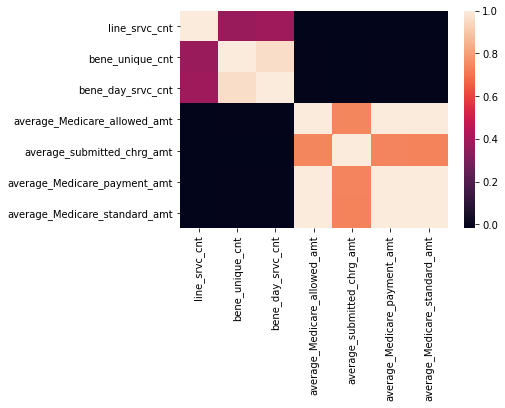

In [17]:
sns.heatmap(med_df.corr())

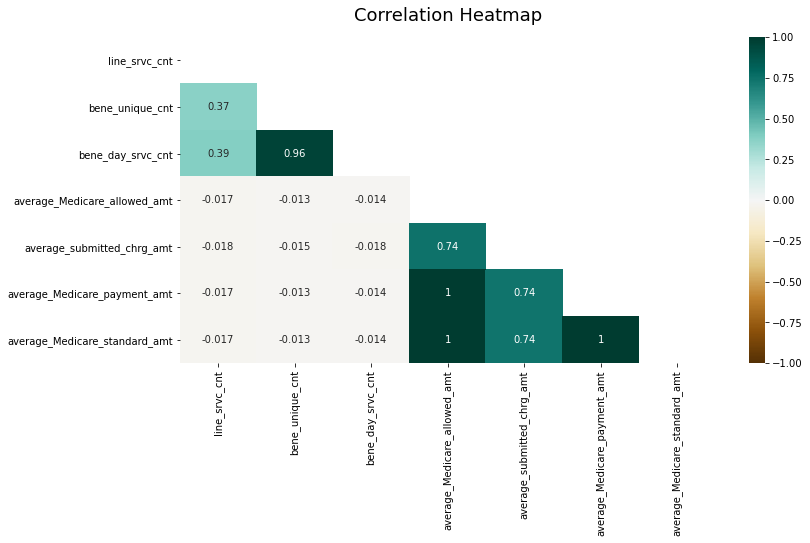

In [18]:
plt.figure(figsize=(12, 6))
# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(med_df.corr(), dtype=np.bool))
heatmap = sns.heatmap(med_df.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=16);

### Encoding the columns

Encodiing the <strong>Provider type</strong> and <strong>hcpcs_code</strong> columns.

In [19]:
# Creating a dict for the provider type
provd_type_code = dict(zip(med_df['provider_type'].unique(), range(5, len(med_df['provider_type'].unique()) + 5)))
med_df['provider_type'].value_counts()

provd_type_code.get('Diagnostic Radiology')

12

In [20]:
# encoding the provider type
for desc_ in med_df['provider_type'].unique():
    med_df['provider_type'].replace(desc_, provd_type_code.get(desc_), inplace=True)

In [21]:
# creating a dict for the hcpcs_code

hcp_code = dict(zip(med_df['hcpcs_code'].unique(), range(10, len(med_df['hcpcs_code'].unique()) + 10)))

In [22]:
# encoding the hcpcs_code 
for code_ in med_df['hcpcs_code'].unique():
    med_df['hcpcs_code'].replace(code_, hcp_code.get(code_), inplace=True)

In [23]:
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer

In [24]:
le = LabelEncoder()

In [25]:
med_df['medicare_participation_indicator'] = le.fit_transform(med_df['medicare_participation_indicator'])
med_df['place_of_service'] = le.fit_transform(med_df['place_of_service'])
med_df['hcpcs_drug_indicator'] = le.fit_transform(med_df['hcpcs_drug_indicator'])

med_df.head(3)

,nppes_provider_gender,provider_type,medicare_participation_indicator,place_of_service,hcpcs_code,hcpcs_drug_indicator,line_srvc_cnt,bene_unique_cnt,bene_day_srvc_cnt,average_Medicare_allowed_amt,average_submitted_chrg_amt,average_Medicare_payment_amt,average_Medicare_standard_amt
0,M,5,1,0,10,0,13.0,12.0,12.0,7.03,7.030000,5.451538,5.921538
1,M,6,1,1,11,0,91.0,80.0,86.0,9.99,25.000000,9.790000,9.790000
2,M,7,1,0,12,0,14.0,14.0,14.0,190.42,424.714286,149.290000,148.740000


<h6>Splitting the dataframe into object type and non object type.</h6>

In [26]:
# Dataframe of non-object type
med_df_non_obj = med_df.drop(['nppes_provider_gender'], axis=1) 

# Dataframe of object type
med_df_obj = med_df.drop(med_df.columns.difference(['nppes_provider_gender']), axis=1)

In [27]:
# Encoding the gender with OneHotEncoder
ct = ColumnTransformer(transformers=[('encoder', OneHotEncoder(), ['nppes_provider_gender'])], remainder='passthrough')
med_df_o = ct.fit_transform(med_df_obj)

In [28]:
med_df_obj2 = pd.DataFrame(med_df_o)
med_df_obj2

,0,1,2
0,0.0,1.0,0.0
1,0.0,1.0,0.0
2,0.0,1.0,0.0
3,0.0,1.0,0.0
4,0.0,1.0,0.0
...,...,...,...
99977,0.0,1.0,0.0
99978,1.0,0.0,0.0
99979,0.0,1.0,0.0
99980,1.0,0.0,0.0


### Normalizing the dataset

In [29]:
# Creating an instance of the MinMAxScaler class
scaler = MinMaxScaler() 

In [30]:
headers_non_obj = med_df_non_obj.columns

In [31]:
# scaling the non-object dataframe
med_df_non_obj = scaler.fit_transform(med_df_non_obj)

In [32]:
# Data Normalized
med_df_non_obj = pd.DataFrame(med_df_non_obj, columns=headers_non_obj)
med_df_non_obj

,provider_type,medicare_participation_indicator,place_of_service,hcpcs_code,hcpcs_drug_indicator,line_srvc_cnt,bene_unique_cnt,bene_day_srvc_cnt,average_Medicare_allowed_amt,average_submitted_chrg_amt,average_Medicare_payment_amt,average_Medicare_standard_amt
0,0.000000,1.0,0.0,0.000000,0.0,0.000004,0.000009,0.000004,0.000169,0.000070,0.000168,0.000182
1,0.010870,1.0,1.0,0.000380,0.0,0.000177,0.000628,0.000321,0.000241,0.000250,0.000301,0.000301
2,0.021739,1.0,0.0,0.000760,0.0,0.000007,0.000027,0.000013,0.004594,0.004247,0.004594,0.004577
3,0.032609,1.0,1.0,0.001140,0.0,0.000071,0.000173,0.000133,0.000871,0.001159,0.000812,0.000729
4,0.043478,1.0,0.0,0.001520,0.0,0.000002,0.000009,0.000004,0.006354,0.010023,0.006238,0.006695
...,...,...,...,...,...,...,...,...,...,...,...,...
99977,0.021739,1.0,0.0,0.160714,0.0,0.000009,0.000036,0.000017,0.000312,0.002150,0.000291,0.000292
99978,0.076087,1.0,0.0,0.003040,0.0,0.000007,0.000009,0.000004,0.000223,0.000450,0.000212,0.000238
99979,0.076087,1.0,0.0,0.015578,0.0,0.000022,0.000091,0.000043,0.002127,0.006560,0.002084,0.002087
99980,0.097826,1.0,1.0,0.004179,0.0,0.000002,0.000009,0.000004,0.000175,0.000170,0.000148,0.000150


In [33]:
# Joining the object and non-object type dataframes.

norm_med_df = pd.concat([med_df_obj2, med_df_non_obj], axis=1)
norm_med_df.shape

(99982, 15)

In [34]:
norm_med_df.rename(columns={0: 'F', 1: 'M', 2: 'O'}, inplace=True)

In [35]:
norm_med_df.shape

(99982, 15)

<h2>Training the model</h2>

In [36]:
from sklearn.ensemble import IsolationForest

In [37]:
model_ = IsolationForest(contamination=0.35) # Creating an instance of the IForest class

In [38]:
model_.fit(norm_med_df)

IsolationForest(contamination=0.35)

In [39]:
# Predicting anomalies
pred_values = model_.predict(norm_med_df)
pred_values.shape

(99982,)

In [40]:
(pred_values < 0).mean() * 100# Checking the contamination level

35.00030005400972

In [41]:
abnor_id_ = np.where(pred_values < 0) # Getting the indices of the flagged observations.

In [42]:
pred_values_df = pd.DataFrame(pred_values, columns=['Pred_value'])

In [43]:
# combining the predicted values and main df
result = pd.concat([med_df_copy, pred_values_df],axis=1)

result.head()

,npi,nppes_provider_last_org_name,nppes_provider_first_name,nppes_provider_mi,nppes_credentials,nppes_provider_gender,nppes_entity_code,nppes_provider_street1,nppes_provider_street2,nppes_provider_city,...,hcpcs_description,hcpcs_drug_indicator,line_srvc_cnt,bene_unique_cnt,bene_day_srvc_cnt,average_Medicare_allowed_amt,average_submitted_chrg_amt,average_Medicare_payment_amt,average_Medicare_standard_amt,Pred_value
0,1.518038e+09,ZWIENER,JOHN,R,MD,M,I,1008 W PIERCE ST,SUITE 1A,CARLSBAD,...,Pathology examination of tissue using a micros...,N,13.0,12.0,12.0,7.030000,7.030000,5.451538,5.921538,1.0
1,1.205975e+09,DAVIS,COLE,NaN,M.D.,M,I,10901 E 48TH ST,NaN,TULSA,...,Bacterial urine culture,N,91.0,80.0,86.0,9.990000,25.000000,9.790000,9.790000,1.0
2,1.881846e+09,RAMOS,GERALDO,A,MD,M,I,620 10TH STREET N.,NaN,ST. PETERSBURG,...,"Hospital observation care, typically 70 minutes",N,14.0,14.0,14.0,190.420000,424.714286,149.290000,148.740000,1.0
3,1.790780e+09,YEH,GEORGE,L,MD,M,I,3414 OLANDWOOD CT,NaN,OLNEY,...,"X-ray of hand, minimum of 3 views",N,43.0,30.0,42.0,36.101395,115.950000,26.387674,23.711163,1.0
4,1.073601e+09,VIRAMONTES,JOSE,NaN,M.D.,M,I,960 N 16TH ST,SUITE 108,SPRINGFIELD,...,Laser destruction of incompetent vein of arm o...,N,12.0,12.0,12.0,263.392500,1002.333333,202.717500,217.568333,-1.0


In [44]:
# dropping missing values.
result.dropna(subset=['Pred_value'], axis=0, inplace=True)

In [45]:
neg_one = result[result['Pred_value'] == -1] # filtering for the observations that were flagged as anomaly
fraud_id_no = neg_one[['npi']]

In [46]:
fraud_id_no[fraud_id_no.npi == 1346324829].index

Int64Index([95035], dtype='int64')

### Visualization of the distribution of outliers in the dataset

In [47]:
fig = px.scatter(result.reset_index(), y='average_submitted_chrg_amt', x='average_Medicare_allowed_amt', color='Pred_value')

fig.show()

Predict_value = -1 indicates an outlier (anomaly)